# Beautiful geo plot with heatmap & date-scroll

https://www.jumpingrivers.com/blog/interactive-maps-python-covid-19-spread/

In [42]:
# %conda install -c conda-forge branca

In [43]:
# %conda install -c conda-forge folium

In [44]:
import branca.colormap as cm
import folium
import geopandas as gpd
import numpy as np
import pandas as pd

In [45]:
corona_df = pd.read_csv("covid_data_kaggle/covid_19_data.csv")
countries = gpd.read_file('covid_data_kaggle/world_countries_1/World_Countries__Generalized_.shp')

In [46]:
# To be able to join the shapefile and the coronavirus data, we need to do edit some of the information in both files.
# Unfortunately, this is a rather manual process.


In [47]:
# First, we need to make sure that the country names match between the data and the shapefiles
# it's a manual effort

corona_df = corona_df.replace({'Country/Region' : 
                      dict.fromkeys(['Taiwan', 'Mainland China', 'Hong Kong', 'Macau'], 
                                     'China')})
corona_df = corona_df.replace({'Country/Region' : 'US'}, 'United States')
corona_df = corona_df.replace({'Country/Region' : 'UK'}, 'United Kingdom')
corona_df = corona_df.replace({'Country/Region' : 'North Ireland'}, 'United Kingdom')
corona_df = corona_df.replace({'Country/Region' : 'Republic of Ireland'}, 'Ireland')
corona_df = corona_df.replace({'Country/Region' : 'Vatican City'}, 'Italy')
countries = countries.replace({'CNTRY_NAME' : 'Byelarus'}, 'Belarus')
countries = countries.replace({'CNTRY_NAME' : 'Macedonia'}, 'North Macedonia')


# make sure country names are the same in both files
countries = countries.rename(columns={'COUNTRY': 'Country/Region'})

In [48]:
# remove countries with no confirmed cases
corona_df = corona_df[corona_df.Confirmed != 0]

In [49]:
# let's inspect
countries

,FID,Country/Region,ISO,COUNTRYAFF,AFF_ISO,SHAPE_Leng,SHAPE_Area,geometry
0,1,American Samoa,AS,United States,US,0.600124,0.013720,"POLYGON ((-170.74390 -14.37555, -170.74942 -14..."
1,2,United States Minor Outlying Islands,UM,United States,US,0.480216,0.003216,"MULTIPOLYGON (((-160.02114 -0.39805, -160.0281..."
2,3,Cook Islands,CK,New Zealand,NZ,0.980664,0.013073,"MULTIPOLYGON (((-159.74698 -21.25667, -159.793..."
3,4,French Polynesia,PF,France,FR,3.930211,0.175332,"MULTIPOLYGON (((-149.17920 -17.87084, -149.258..."
4,5,Niue,NU,New Zealand,NZ,0.541413,0.021414,"POLYGON ((-169.89389 -19.14556, -169.93088 -19..."
...,...,...,...,...,...,...,...,...
244,245,Northern Mariana Islands,MP,United States,US,0.908853,0.019927,"MULTIPOLYGON (((145.73468 15.08722, 145.72830 ..."
245,246,Palau,PW,Palau,PW,1.105323,0.031136,"MULTIPOLYGON (((134.53137 7.35444, 134.52234 7..."
246,247,Russian Federation,RU,Russian Federation,RU,1536.287150,2931.526082,"MULTIPOLYGON (((-179.99999 68.98010, -179.9580..."
247,248,Spain,ES,Spain,ES,51.724956,52.915449,"MULTIPOLYGON (((-2.91472 35.27361, -2.93924 35..."


In [50]:
# let's inspect
corona_df

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,China,1/22/2020 17:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,China,1/22/2020 17:00,1.0,0.0,0.0
5,6,01/22/2020,Guangdong,China,1/22/2020 17:00,26.0,0.0,0.0
...,...,...,...,...,...,...,...,...
95279,95280,08/25/2020,Zaporizhia Oblast,Ukraine,2020-08-26 04:28:11,1407.0,24.0,767.0
95280,95281,08/25/2020,Zeeland,Netherlands,2020-08-26 04:28:11,1024.0,70.0,0.0
95281,95282,08/25/2020,Zhejiang,China,2020-08-26 04:28:11,1277.0,1.0,1268.0
95282,95283,08/25/2020,Zhytomyr Oblast,Ukraine,2020-08-26 04:28:11,2923.0,60.0,1753.0


In [51]:
# We then sort our data by country and reset the index:

sorted_df = corona_df.sort_values(['Country/Region', 
                     'ObservationDate']).reset_index(drop=True)

In [52]:
# Some countries, such as China, are split into different provinces/states.
# Since we just want the total number of cases per country, we get the sum for each country at each date:

sum_df = sorted_df.groupby(['Country/Region', 'ObservationDate'], as_index=False).sum()

In [53]:
# Now we can join the data and the shapefile together:

joined_df = sum_df.merge(countries, on='Country/Region')

In [54]:
# We are going to plot the log of the number of confirmed cases for each country,
# as there are a couple of countries, such as China and Italy, with a lot more cases compared to other countries.

joined_df['log_Confirmed'] = np.log10(joined_df['Confirmed'])

In [55]:
# We also need to convert the ObservationDate to unix time in nanoseconds:

joined_df['date_sec'] = pd.to_datetime(joined_df['ObservationDate']).astype(int) / 10**9
joined_df['date_sec'] = joined_df['date_sec'].astype(int).astype(str)

In [56]:
# We can now select the columns needed for the map and discard the others:

joined_df = joined_df[['Country/Region', 'date_sec', 'log_Confirmed', 'geometry']]

In [57]:
# time to map

In [58]:
# We have to first initialise the map.
# Folium allows the use of different map tiles.
# If we do not specify a map, it defaults to OpenStreetMap.
# Here, we will use 'cartodbpositron':

mymap = folium.Map(tiles='cartodbpositron')

# mymap
# mymap.save(outfile='infinite_scroll.html')

In [59]:
# there are a couple of problems:
# the continents are continually repeated and the map can be panned endlessly from either side.
# In order to prevent this from happening, we set a minimum zoom and set max_bounds=True:

mymap_fix_boundary = folium.Map(min_zoom=2, max_bounds=True, tiles='cartodbpositron')

# mymap_fix_boundary
# mymap_fix_boundary.save(outfile='fix_boundary.html')

In [60]:
# Now we define a colour map in terms of the log of the number of confirmed cases

max_colour = max(joined_df['log_Confirmed'])
min_colour = min(joined_df['log_Confirmed'])
cmap = cm.linear.YlOrRd_09.scale(min_colour, max_colour)
joined_df['colour'] = joined_df['log_Confirmed'].map(cmap)

In [61]:
# Next, we construct our style dictionary:

# styledict = {
#     : {
#         : {'color': , 'opacity': }
#         : {'color': , 'opacity': }
#         ...
#         },
#     ...,
#     : {
#         : {'color': , 'opacity': }
#         : {'color': , 'opacity': }
#         ...
#         }
# }

country_list = joined_df['Country/Region'].unique().tolist()
country_idx = range(len(country_list))

style_dict = {}
for i in country_idx:
    country = country_list[i]
    result = joined_df[joined_df['Country/Region'] == country]
    inner_dict = {}
    for _, r in result.iterrows():
        inner_dict[r['date_sec']] = {'color': r['colour'], 'opacity': 0.7}
    style_dict[str(i)] = inner_dict

In [62]:
# Then we need to make a dataframe containing the features for each country:

countries_df = joined_df[['geometry']]
countries_gdf = gpd.GeoDataFrame(countries_df)
countries_gdf = countries_gdf.drop_duplicates().reset_index()

In [63]:
countries_gdf

,index,geometry
0,0,"POLYGON ((61.27655 35.60725, 61.29638 35.62854..."
1,184,"POLYGON ((19.57083 41.68527, 19.58195 41.69569..."
2,354,"POLYGON ((4.60335 36.88791, 4.63555 36.88638, ..."
3,537,"POLYGON ((1.44584 42.60194, 1.48653 42.65042, ..."
4,714,"MULTIPOLYGON (((23.47611 -17.62584, 23.28916 -..."
...,...,...
185,29736,"MULTIPOLYGON (((-66.31029 10.62602, -66.28309 ..."
186,29901,"MULTIPOLYGON (((107.07896 17.10804, 107.08333 ..."
187,30117,"MULTIPOLYGON (((47.25445 13.61528, 47.16888 13..."
188,30255,"POLYGON ((30.21302 -14.98172, 30.21916 -15.096..."


In [23]:
# Finally, we create our map and add a colourbar:

# The TimeSliderChoropleth class needs at least two arguments:
# a GeoJSON file containing the features (in this case, the countries) and a style dictionary.

from folium.plugins import TimeSliderChoropleth

slider_map = folium.Map(min_zoom=2, max_bounds=True,tiles='cartodbpositron')

_ = TimeSliderChoropleth(
    data=countries_gdf.to_json(),
    styledict=style_dict,

).add_to(slider_map)

_ = cmap.add_to(slider_map)
cmap.caption = "Log of number of confirmed cases"

slider_map
# slider_map.save(outfile='TimeSliderChoropleth.html')

# Change format of Nigeria state map so folium can use it

In [65]:
import fiona
import geopandas as gpd

<AxesSubplot:>

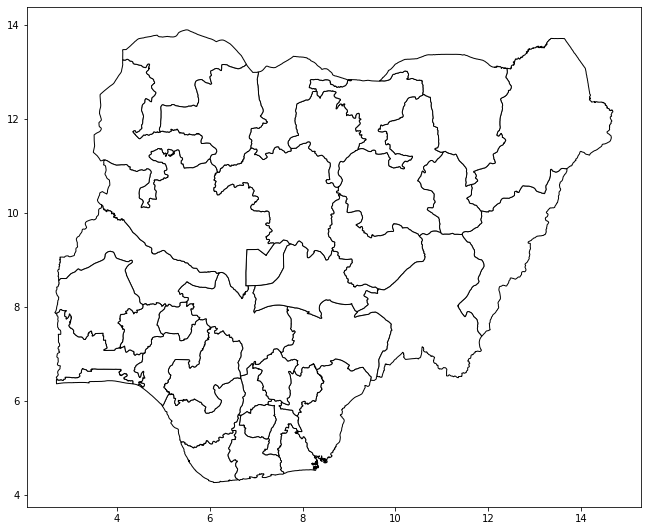

In [98]:
states_file = "nga_admbnda_osgof_eha_itos.gdb/nga_admbnda_osgof_eha_itos.gdb/nga_admbnda_osgof_eha_itos.gdb/nga_admbnda_osgof_eha_itos.gdb/"

# geopandas included map, filtered to just Nigeria
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world.crs = "EPSG:4326"
nigeria = world[(world['name'] == 'Nigeria')]
base = nigeria.plot(color='white', edgecolor='black', alpha=0, figsize=(11, 11))

layers = fiona.listlayers(states_file)
zones_gdf = gpd.read_file(states_file, layer=1)
zones_gdf.crs = "EPSG:4326"
zones_gdf = zones_gdf.set_index('admin1Name_en')
zones_gdf.plot(ax=base, color='white', edgecolor='black')

## works equally well:
# zones_gdf_2 = zones_gdf[['geometry']]
# zones_gdf.plot(ax=base, color='white', edgecolor='black')

In [101]:
zones_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 37 entries, Abia to Zamfara
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   admin1Pcode        37 non-null     object  
 1   admin1RefName      37 non-null     object  
 2   admin1AltName1_en  0 non-null      object  
 3   admin1AltName2_en  0 non-null      object  
 4   admin0Name_en      37 non-null     object  
 5   admin0Pcode        37 non-null     object  
 6   date               37 non-null     object  
 7   validOn            37 non-null     object  
 8   validTo            0 non-null      object  
 9   Shape_Length       37 non-null     float64 
 10  Shape_Area         37 non-null     float64 
 11  geometry           37 non-null     geometry
dtypes: float64(2), geometry(1), object(9)
memory usage: 3.8+ KB


In [67]:
# convert Nigeria map & states map into json (via crs)
# folium likes json => good

nigeria_json = nigeria.to_crs(epsg='4326').to_json()
states_json = zones_gdf.to_crs(epsg='4326').to_json()

In [68]:
# make a map

mapa = folium.Map(tiles='cartodbpositron')

points_1 = folium.features.GeoJson(nigeria_json)
points_2 = folium.features.GeoJson(states_json)

mapa.add_children(points_2)
mapa.add_children(points_1)

mapa

<ipython-input-68-6f123a04850e>:6: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  mapa.add_children(points_2)
<ipython-input-68-6f123a04850e>:7: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  mapa.add_children(points_1)


In [69]:
# get my Nigerian data

covid_states = pd.read_csv('giant_df_states.csv')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3727 entries, 0 to 3726
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   admin1Name_en      3727 non-null   object 
 1   admin1Pcode        3727 non-null   object 
 2   admin1RefName      3727 non-null   object 
 3   admin1AltName1_en  0 non-null      float64
 4   admin1AltName2_en  0 non-null      float64
 5   admin0Name_en      3727 non-null   object 
 6   admin0Pcode        3727 non-null   object 
 7   dateleft           3727 non-null   object 
 8   validOn            3727 non-null   object 
 9   validTo            0 non-null      float64
 10  Shape_Length       3727 non-null   float64
 11  Shape_Area         3727 non-null   float64
 12  geometry           3727 non-null   object 
 13  state              3727 non-null   object 
 14  total_confirmed    3727 non-null   int64  
 15  new_confirmed      3727 non-null   int64  
 16  total_discharged   3727 

In [70]:
# covid_states.drop(['validTo', 'admin1AltName1_en', 'admin1AltName2_en'], axis=1, inplace=True)
# covid_states.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3727 entries, 0 to 3726
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   admin1Name_en      3727 non-null   object 
 1   admin1Pcode        3727 non-null   object 
 2   admin1RefName      3727 non-null   object 
 3   admin1AltName1_en  0 non-null      float64
 4   admin1AltName2_en  0 non-null      float64
 5   admin0Name_en      3727 non-null   object 
 6   admin0Pcode        3727 non-null   object 
 7   dateleft           3727 non-null   object 
 8   validOn            3727 non-null   object 
 9   validTo            0 non-null      float64
 10  Shape_Length       3727 non-null   float64
 11  Shape_Area         3727 non-null   float64
 12  geometry           3727 non-null   object 
 13  state              3727 non-null   object 
 14  total_confirmed    3727 non-null   int64  
 15  new_confirmed      3727 non-null   int64  
 16  total_discharged   3727 

In [71]:
covid_states[['admin1Name_en', 'geometry']]

,admin1Name_en,geometry
0,Abia,MULTIPOLYGON (((7.386810307000076 6.0366749930...
1,Abia,MULTIPOLYGON (((7.386810307000076 6.0366749930...
2,Abia,MULTIPOLYGON (((7.386810307000076 6.0366749930...
3,Abia,MULTIPOLYGON (((7.386810307000076 6.0366749930...
4,Abia,MULTIPOLYGON (((7.386810307000076 6.0366749930...
...,...,...
3722,Zamfara,MULTIPOLYGON (((6.848701061000043 13.082395727...
3723,Zamfara,MULTIPOLYGON (((6.848701061000043 13.082395727...
3724,Zamfara,MULTIPOLYGON (((6.848701061000043 13.082395727...
3725,Zamfara,MULTIPOLYGON (((6.848701061000043 13.082395727...


In [72]:
# We also need to convert the ObservationDate to unix time in nanoseconds:

covid_states['date_sec'] = pd.to_datetime(covid_states['date']).astype(int) / 10**9
covid_states['date_sec'] = covid_states['date_sec'].astype(int).astype(str)

In [73]:
covid_states.columns

Index(['admin1Name_en', 'admin1Pcode', 'admin1RefName', 'admin1AltName1_en',
       'admin1AltName2_en', 'admin0Name_en', 'admin0Pcode', 'dateleft',
       'validOn', 'validTo', 'Shape_Length', 'Shape_Area', 'geometry', 'state',
       'total_confirmed', 'new_confirmed', 'total_discharged', 'new_dicharged',
       'total_deaths', 'new_deaths', 'total_active', 'date', 'date_sec'],
      dtype='object')

In [106]:
# We can now select the columns needed for the map and discard the others:

covid_states = covid_states[['admin1Name_en', 'date_sec', 'total_confirmed', 'new_confirmed',
       'total_discharged', 'new_dicharged', 'total_deaths', 'new_deaths', 'total_active']]

covid_states = covid_states.merge(zones_gdf, on='admin1Name_en')

covid_states = covid_states.rename(columns={'admin1Name_en': 'state'})

covid_states

KeyError: "['admin1Name_en'] not in index"

In [75]:
# start plotting etc

In [76]:
# We have to first initialise the map.
# Folium allows the use of different map tiles.
# If we do not specify a map, it defaults to OpenStreetMap.
# Here, we will use 'cartodbpositron':

mymap = folium.Map(tiles='cartodbpositron')

# mymap
# mymap.save(outfile='infinite_scroll.html')

# there are a couple of problems:
# the continents are continually repeated and the map can be panned endlessly from either side.
# In order to prevent this from happening, we set a minimum zoom and set max_bounds=True:

mymap_fix_boundary = folium.Map(min_zoom=2, max_bounds=True, tiles='cartodbpositron')

In [77]:
# Now we define a colour map in terms of new_confirmed cases

max_colour = max(covid_states['new_confirmed'])
min_colour = min(covid_states['new_confirmed'])
cmap = cm.linear.YlOrRd_09.scale(min_colour, max_colour)
covid_states['colour'] = covid_states['new_confirmed'].map(cmap)

In [78]:
# Next, we construct our style dictionary

state_list = covid_states['state'].unique().tolist()
state_idx = range(len(state_list))

style_dict = {}
for i in state_idx:
    state = state_list[i]
    result = covid_states[covid_states['state'] == state]
    inner_dict = {}
    for _, r in result.iterrows():
        inner_dict[r['date_sec']] = {'color': r['colour'], 'opacity': 0.7}
    style_dict[str(i)] = inner_dict

In [105]:
# Then we need to make a dataframe containing the features for each country:

states_df = covid_states[['geometry']]
states_gdf = gpd.GeoDataFrame(states_df, geometry='geometry')
states_gdf = states_gdf.drop_duplicates().reset_index()

states_gdf.info()
# states_gdf

TypeError: Input must be valid geometry objects: MULTIPOLYGON (((7.386810307000076 6.036674993000076, 7.387286103000065 6.036048758000049, 7.388858308000067 6.036198957000067, 7.392545963000032 6.035476920000065, 7.396972560000052 6.034389046000058, 7.400671440000053 6.031083010000032, 7.401421344000028 6.02813311500006, 7.401171575000035 6.017093758000044, 7.404417919000025 6.012404418000074, 7.415839538000057 6.006217950000064, 7.430592102000048 6.006217990000039, 7.431148016000066 6.006420018000028, 7.431351395000036 6.008329485000047, 7.433186885000055 6.009814017000053, 7.43716226600003 6.008607143000063, 7.451531297000031 6.013832119000028, 7.461525213000073 6.014783822000027, 7.475801725000053 6.012404450000076, 7.493886141000075 6.016687393000041, 7.510541782000075 6.021446280000021, 7.52005992200003 6.02001858400007, 7.53069840400002 6.012799714000039, 7.536556849000021 6.008112341000071, 7.542301275000057 6.000847251000039, 7.547191706000035 5.994943128000045, 7.553372531000036 5.98147156400006, 7.552927325000041 5.966341516000057, 7.546111651000047 5.964138568000067, 7.540604877000021 5.959317859000066, 7.540256563000071 5.954148658000065, 7.542506520000074 5.944190923000065, 7.547552210000049 5.933350197000038, 7.53957179300005 5.907232320000048, 7.518661551000037 5.908042847000047, 7.49757730400006 5.907660092000071, 7.498110587000042 5.900822522000055, 7.500358344000063 5.891603284000041, 7.520278598000061 5.883932648000041, 7.526187758000049 5.879896027000029, 7.527319673000022 5.873256096000034, 7.526968648000036 5.868825104000052, 7.524774164000064 5.865124816000048, 7.52257916800005 5.861424641000042, 7.522592537000037 5.858102446000032, 7.527053056000057 5.847784641000032, 7.53150061100007 5.840788977000045, 7.532985728000028 5.837841899000068, 7.535199275000025 5.836743299000034, 7.539614244000063 5.837868446000073, 7.544391577000056 5.840471337000054, 7.551944996000032 5.843462884000076, 7.552491313000075 5.843480587000045, 7.56669762100006 5.843938843000046, 7.570980526000028 5.841083097000023, 7.584781440000029 5.837275942000076, 7.595514055000024 5.834386472000062, 7.605917072000068 5.834066854000071, 7.612911476000022 5.834831736000069, 7.622487368000066 5.834498747000055, 7.626171728000031 5.834143555000026, 7.630965567000032 5.832315816000062, 7.650026825000054 5.824476664000031, 7.657116623000036 5.823951305000037, 7.683954931000073 5.822346219000053, 7.70423048400005 5.81919235600003, 7.713078744000029 5.818000859000051, 7.728976790000047 5.81586078600003, 7.756578414000046 5.813005388000022, 7.764192295000043 5.813957255000048, 7.780373146000045 5.806818903000021, 7.786321889000021 5.804915420000043, 7.792984109000031 5.79159071600003, 7.793935864000048 5.777313690000028, 7.796790871000042 5.761609056000054, 7.803930087000026 5.744953138000028, 7.815351161000024 5.735910923000063, 7.820585659000074 5.727820810000026, 7.830579626000031 5.723062066000068, 7.840573117000076 5.710688564000066, 7.861988669000027 5.697363869000071, 7.870554614000071 5.693556846000035, 7.886259341000027 5.687846200000024, 7.890100026000027 5.684799704000056, 7.893288673000029 5.682270450000033, 7.897023982000064 5.677111088000061, 7.901621535000061 5.670236130000035, 7.906209269000044 5.665658941000061, 7.91079631100007 5.661083265000059, 7.915388335000046 5.655356841000071, 7.91769669200005 5.649620060000075, 7.916587107000055 5.642717769000058, 7.914336413000058 5.635811822000051, 7.914361854000049 5.63006402600007, 7.914372024000045 5.627766178000059, 7.913272764000055 5.618565040000021, 7.913289148000047 5.615117075000057, 7.912205738000068 5.609528041000033, 7.90637079000004 5.603640823000035, 7.902698386000054 5.601045796000051, 7.901973512000041 5.597352288000025, 7.909987048000062 5.588133485000071, 7.909990006000044 5.587515895000024, 7.907749435000028 5.578310060000035, 7.906092062000027 5.570636730000047, 7.90457888800006 5.568675557000063, 7.90597993800003 5.564770260000046, 7.906691912000042 5.559915087000036, 7.906727687000057 5.551868015000025, 7.90791166300005 5.542678758000022, 7.907942866000042 5.535781823000036, 7.914861313000074 5.520872066000038, 7.920620984000038 5.509404238000059, 7.921783130000051 5.504810766000048, 7.924092691000055 5.499074904000054, 7.926406684000028 5.492188919000057, 7.928716093000048 5.48645302500006, 7.931040556000028 5.477268150000043, 7.934503304000032 5.46923786800005, 7.939105949000066 5.461213108000038, 7.943693411000027 5.456635998000024, 7.947137926000039 5.452054980000071, 7.950584057000071 5.447473081000055, 7.954035053000041 5.44174100500004, 7.956337648000044 5.437153810000041, 7.958647941000038 5.431417999000075, 7.959815993000063 5.425675828000067, 7.964424154000028 5.416502040000069, 7.969032085000038 5.407328172000064, 7.972493342000064 5.399298216000034, 7.973661056000026 5.393556123000053, 7.978248386000075 5.388978998000027, 7.980556910000075 5.383243055000037, 7.984012816000075 5.376361835000068, 7.986322870000038 5.370625006000068, 7.986339130000033 5.367177011000024, 7.987501126000041 5.362585014000047, 7.986369969000066 5.360281014000066, 7.985238846000072 5.357976862000044, 7.982965742000033 5.35566811800004, 7.977264179000031 5.354492152000034, 7.972698011000034 5.354471272000069, 7.968125797000027 5.355598907000058, 7.962418785000068 5.355573115000027, 7.957847076000064 5.356701919000045, 7.94985723700006 5.356665165000038, 7.941861249000056 5.357778085000064, 7.933869691000041 5.35774084600007, 7.920155871000077 5.361125961000027, 7.912165347000041 5.36108923200004, 7.90188119000004 5.363340797000035, 7.890454902000045 5.365587176000076, 7.880370181000046 5.366795550000063, 7.877982882000026 5.367052017000049, 7.876112163000073 5.368900775000043, 7.882703750000076 5.382002331000024, 7.878330683000058 5.385394439000038, 7.875004689000036 5.390552099000047, 7.872156290000021 5.400441082000043, 7.871191943000042 5.402336134000052, 7.86826824000002 5.40808290800004, 7.867661173000045 5.411540935000062, 7.866485372000056 5.414418153000042, 7.865297523000038 5.418448045000048, 7.863560923000023 5.420166014000074, 7.86125615800006 5.421300936000023, 7.858384317000059 5.421855027000049, 7.856084126000042 5.422412869000027, 7.853218018000064 5.422390024000038, 7.850350784000057 5.422367153000039, 7.838315973000022 5.421692802000052, 7.821098612000071 5.423284971000044, 7.80901209700005 5.427803955000059, 7.798606198000073 5.436378009000066, 7.792839312000069 5.439794022000058, 7.788779021000039 5.444377920000022, 7.787598342000024 5.447832077000044, 7.786410665000062 5.451861841000039, 7.784661821000043 5.454733795000038, 7.784059753000065 5.457613933000061, 7.782861978000028 5.462799034000057, 7.781096055000035 5.46740191300006, 7.779921099000035 5.470277740000029, 7.778172117000054 5.473149791000026, 7.775856133000048 5.475440074000062, 7.774117721000039 5.477157055000021, 7.768929274000072 5.480000977000032, 7.765461015000028 5.48285912800003, 7.763133109000023 5.486302801000022, 7.761395711000034 5.488019873000042, 7.760225859000059 5.490318740000021, 7.759629970000049 5.492622813000025, 7.760156868000024 5.497243832000038, 7.759550317000048 5.500701954000021, 7.760077222000064 5.505323954000062, 7.758901961000049 5.508200136000028, 7.757159108000053 5.510495210000045, 7.754848091000042 5.51220803800004, 7.751385314000061 5.514488159000052, 7.748500766000063 5.516195725000046, 7.745628029000045 5.516749779000065, 7.742755837000061 5.517303961000039, 7.734149941000055 5.517811861000041, 7.729569145000028 5.517197130000056, 7.72670768100005 5.51659684200007, 7.72328522600003 5.514838189000045, 7.719288740000025 5.513073972000029, 7.717000798000072 5.512478859000055, 7.713567041000033 5.511874179000074, 7.710693714000058 5.51242780900003, 7.71122710700007 5.516471878000061, 7.71062605700007 5.519352895000054, 7.707765159000076 5.518753015000073, 7.704908579000062 5.517574790000026, 7.70194088900007 5.517550974000073, 7.695939132000035 5.518277608000062, 7.694026670000028 5.516333055000075, 7.692904251000073 5.514016165000044, 7.691780173000041 5.511697728000058, 7.691235008000035 5.508808115000022, 7.690116944000067 5.505912762000037, 7.691304173000049 5.501883034000059, 7.693046826000057 5.499587994000024, 7.694784048000031 5.497869987000058, 7.697673555000051 5.495584948000044, 7.699989599000048 5.493295179000029, 7.702318126000023 5.48985103800004, 7.704072047000068 5.48640301000006, 7.704680222000036 5.482944983000039, 7.704714963000072 5.479482236000024, 7.703614247000075 5.474855834000039, 7.703653856000074 5.47081619000005, 7.703115181000044 5.467348997000045, 7.703143964000049 5.464464123000027, 7.703166176000025 5.462154879000025, 7.703194959000029 5.459270003000029, 7.70267910900003 5.453494103000025, 7.701567109000052 5.450022184000034, 7.70101597200005 5.447709047000046, 7.699899137000045 5.444815148000032, 7.699938767000049 5.440774944000054, 7.700534946000062 5.438470835000032, 7.700563732000035 5.43558497600003, 7.700030002000062 5.431541007000021, 7.697731201000067 5.432099839000045, 7.695414955000047 5.434390042000075, 7.693110132000072 5.435524867000026, 7.691372643000022 5.437243034000062, 7.689073778000022 5.437800940000045, 7.685628200000053 5.43835120600005, 7.682176027000025 5.43947703300006, 7.678157063000072 5.440022046000024, 7.675851580000028 5.441156908000039, 7.674121142000047 5.442296956000064, 7.671810166000057 5.444009835000031, 7.669499167000026 5.445723108000038, 7.66776151800002 5.447441143000049, 7.663176232000069 5.447402898000064, 7.660308807000035 5.447380942000052, 7.656886173000032 5.445620954000049, 7.655248310000047 5.444222893000074, 7.653473996000059 5.442708015000051, 7.651240689000076 5.440418688000022, 7.64893277300007 5.438054047000037, 7.646656989000064 5.436304151000058, 7.642666675000044 5.433962898000061, 7.640964291000046 5.432219041000053, 7.639260786000023 5.430472913000074, 7.638136745000054 5.428155006000054, 7.636446002000071 5.425255804000074, 7.63476634400007 5.421203083000023, 7.63421567000006 5.418889992000061, 7.634262111000055 5.414272751000055, 7.634284197000056 5.411963913000022, 7.633746281000072 5.408496889000048, 7.633201152000026 5.405607179000071, 7.632089382000061 5.402134910000029, 7.631544297000062 5.399244770000053, 7.630993674000024 5.396932080000056, 7.629869769000038 5.394614292000028, 7.62875196300007 5.391718887000025, 7.627623125000071 5.389978952000035, 7.626493178000032 5.388237898000057, 7.625362668000037 5.386496969000063, 7.624234416000036 5.384757044000025, 7.623682737000024 5.382443912000042, 7.624279854000065 5.380139795000048, 7.626016811000056 5.378423220000059, 7.628315960000066 5.377863860000048, 7.631183405000058 5.37788818100006, 7.633470928000065 5.378482854000026, 7.636893955000062 5.38024179100006, 7.639742615000046 5.381997148000039, 7.641642711000031 5.38366587400003, 7.644403230000023 5.384600634000037, 7.650654474000021 5.384992863000036, 7.655806592000033 5.384273593000046, 7.662426939000056 5.384297912000022, 7.667942727000025 5.384687297000028, 7.671622537000076 5.384331493000047, 7.675673508000045 5.382869672000027, 7.677594726000052 5.38121641400005, 7.677607003000048 5.379993956000021, 7.677056121000021 5.377680778000069, 7.676528758000075 5.373060169000041, 7.675989927000046 5.369593071000054, 7.673742878000041 5.364956900000038, 7.672624835000022 5.36206190300004, 7.670939033000025 5.35858582700007, 7.669821012000057 5.355690970000069, 7.668140736000055 5.351636853000059, 7.667591076000065 5.349325201000056, 7.666473130000043 5.346429776000036, 7.665349156000048 5.344111946000055, 7.663645957000028 5.342367205000073, 7.662517112000046 5.340625820000071, 7.660807893000026 5.339457959000072, 7.658549109000035 5.335977016000072, 7.656283755000061 5.333073098000057, 7.654581760000042 5.331327891000058, 7.652317037000046 5.328423951000048, 7.65061395500004 5.326679296000066, 7.648910909000051 5.324934059000043, 7.645482841000046 5.323750980000057, 7.64147497700003 5.323142071000063, 7.638045821000048 5.321959936000042, 7.634605630000067 5.321931822000067, 7.630598933000044 5.321321946000069, 7.628889900000047 5.320155195000041, 7.62546689900006 5.318396047000022, 7.622032871000044 5.317791050000039, 7.618012880000038 5.318335116000071, 7.615707968000038 5.319470881000029, 7.612835993000033 5.320025022000038, 7.609962882000048 5.32057913500006, 7.607642375000069 5.323445801000048, 7.606465946000071 5.326322063000021, 7.603020148000041 5.326870972000052, 7.601316752000059 5.325126214000022, 7.59903631800006 5.323953188000075, 7.596764799000027 5.321627198000044, 7.595057008000026 5.320457904000023, 7.591633610000031 5.318698844000039, 7.587619723000046 5.31866694200005, 7.583015866000039 5.320361179000031, 7.581852140000024 5.322083022000072, 7.578973931000064 5.323214068000027, 7.575521937000076 5.324339888000054, 7.572082865000027 5.324313170000039, 7.568091988000049 5.321971936000068, 7.56638315500004 5.320804040000041, 7.564691795000044 5.317903934000071, 7.562449819000051 5.312692147000064, 7.560764730000074 5.309215961000064, 7.559055985000043 5.308046771000022, 7.556207149000045 5.306293035000067, 7.551620249000052 5.30625578300004, 7.549321429000031 5.306815088000064, 7.546436992000054 5.308523197000056, 7.543559334000065 5.309654243000068, 7.540698108000072 5.309052894000047, 7.537848226000051 5.307299158000035, 7.535015956000052 5.30381303200005, 7.534471206000035 5.300922884000045, 7.535635089000039 5.299201043000039, 7.538529697000058 5.296339095000064, 7.540279143000021 5.293467044000067, 7.543169133000049 5.291182088000028, 7.545491070000026 5.288314834000062, 7.547227981000049 5.286598221000077, 7.549555507000036 5.28315404600005, 7.551299154000048 5.280858966000039, 7.55189486300003 5.278554936000035, 7.553071011000043 5.275679121000053, 7.553099265000071 5.272792826000057, 7.55198695200005 5.269320995000044, 7.549722291000023 5.266417945000057, 7.548030740000058 5.263517884000066, 7.545766150000077 5.260613975000069, 7.54349591700003 5.258286948000034, 7.542372428000022 5.25596999000004, 7.541839004000053 5.251924926000072, 7.541873001000056 5.248463160000028, 7.541901894000034 5.245576847000052, 7.541930228000069 5.242691958000023, 7.541390611000054 5.239223934000051, 7.54141383800004 5.236916073000032, 7.542028222000056 5.232881113000076, 7.541489186000035 5.229413942000065, 7.541518078000024 5.226528203000044, 7.541552061000061 5.223065840000061, 7.541030040000066 5.217866848000028, 7.54050915800002 5.212668007000048, 7.540543165000031 5.20920607000005, 7.540572066000038 5.206319772000029, 7.540033079000068 5.202853152000046, 7.540072761000033 5.198812909000026, 7.539523010000039 5.196500789000027, 7.540123766000022 5.193620167000063, 7.539574026000025 5.191307047000066, 7.539041295000061 5.187262972000042, 7.533421826000051 5.175673963000065, 7.528978678000044 5.16121004200005, 7.527884006000022 5.156005894000032, 7.529046889000028 5.154283991000057, 7.530807087000028 5.15025902900004, 7.531415211000024 5.146801026000048, 7.532591102000026 5.143924210000023, 7.533772075000059 5.14047098900005, 7.533233252000059 5.137003926000034, 7.533284901000059 5.131810177000034, 7.533312728000055 5.128923869000062, 7.533933266000076 5.124311939000052, 7.533966754000062 5.12085006500007, 7.533444985000074 5.115651118000073, 7.534063821000075 5.111039180000034, 7.534661041000049 5.108735097000022, 7.536415290000036 5.105287075000035, 7.538170081000032 5.101838102000045, 7.539912918000027 5.099544063000053, 7.541077266000059 5.097821217000046, 7.54282517200005 5.09495017100005, 7.544569094000053 5.092655188000037, 7.54631074100007 5.090361096000038, 7.546906724000053 5.088057081000045, 7.545795048000059 5.08458519200002, 7.544672082000034 5.082266821000076, 7.542996709000022 5.077637236000044, 7.541885103000027 5.07416485400006, 7.54133495800005 5.071852224000054, 7.540216044000033 5.068956859000025, 7.537952123000025 5.066052881000076, 7.535682032000068 5.063725917000056, 7.532269834000033 5.060812994000059, 7.529425920000051 5.058481217000065, 7.525997891000031 5.057299124000053, 7.524289296000063 5.056130887000052, 7.520286861000045 5.054945007000072, 7.518901964000065 5.053178801000058, 7.525101949000032 5.050471310000034, 7.531024827000067 5.048933520000048, 7.530072607000022 5.04758246800003, 7.528321639000069 5.044921129000045, 7.528949023000052 5.038576639000041, 7.527912822000076 5.037692100000072, 7.525625338000054 5.037096954000049, 7.522722189000035 5.036539099000038, 7.520499534000066 5.036615355000038, 7.517972272000065 5.037302045000047, 7.515445774000057 5.038217556000063, 7.512274626000021 5.036597227000073, 7.509670261000053 5.034508663000054, 7.511933116000023 5.030059812000047, 7.51197363700004 5.026020052000035, 7.509726226000055 5.021385210000062, 7.508607695000023 5.018489816000056, 7.507490304000044 5.015594997000051, 7.506365535000043 5.013278050000054, 7.504658329000051 5.012110206000045, 7.491908771000055 5.007781027000021, 7.490524657000037 5.006178856000076, 7.489138671000035 5.003661606000037, 7.487753073000022 5.001602172000048, 7.485214278000058 4.998169447000066, 7.483599384000058 4.996338380000054, 7.480381708000039 4.996567230000039, 7.477856322000036 4.997940565000022, 7.474635123000041 4.99725389300005, 7.471143247000043 4.995911145000036, 7.465689644000065 4.986772593000069, 7.467803142000037 4.984066079000058, 7.468256488000065 4.980971362000048, 7.467827083000032 4.978315273000021, 7.46258202000007 4.973333267000044, 7.463192906000074 4.972528952000062, 7.466083111000046 4.970242982000059, 7.469545917000062 4.967963208000072, 7.47302402400004 4.965508097000054, 7.47756623500004 4.965527092000059, 7.480208315000027 4.965538116000062, 7.481094109000026 4.964214664000053, 7.482131434000053 4.960928083000056, 7.483953706000023 4.960577039000043, 7.486248108000041 4.960595128000023, 7.48911398100006 4.960618036000028, 7.491418717000045 4.959482213000058, 7.492044108000073 4.954292794000025, 7.491505949000043 4.950826151000058, 7.491546117000041 4.946785956000042, 7.490800193000041 4.945568051000066, 7.489898474000029 4.944349924000051, 7.489401086000044 4.942880559000059, 7.488982718000045 4.940661505000037, 7.488173894000056 4.939833166000028, 7.487044857000058 4.938093208000055, 7.484201036000059 4.935760990000063, 7.482492011000033 4.934593178000057, 7.480789877000063 4.932847980000076, 7.478721020000023 4.919539925000038, 7.478094792000036 4.915512057000058, 7.477131710000037 4.908759560000021, 7.480892846000074 4.906262179000066, 7.485747957000058 4.903185676000021, 7.487530675000073 4.897884570000031, 7.487119389000043 4.890804779000064, 7.480714535000061 4.88268964100007, 7.481891325000049 4.879758855000034, 7.484212835000051 4.876893018000032, 7.485383042000024 4.874592808000045, 7.486545806000038 4.872870897000041, 7.487715980000075 4.870572087000028, 7.48888501600004 4.86827278800007, 7.490055160000054 4.865973970000027, 7.491219000000058 4.864252123000028, 7.493530003000046 4.862538812000025, 7.495839840000031 4.860826000000031, 7.498723807000033 4.859118002000059, 7.499338029000057 4.855082993000053, 7.498798823000072 4.85161591800005, 7.497669439000049 4.849874985000042, 7.497135984000067 4.845830931000023, 7.498889889000054 4.842381917000068, 7.500639160000048 4.839510929000028, 7.500667789000033 4.836625082000069, 7.500690675000044 4.834317211000041, 7.499560784000039 4.83257578100006, 7.497859039000048 4.830831009000065, 7.496729148000043 4.829091070000061, 7.494447050000076 4.827918036000028, 7.493318330000022 4.826177091000034, 7.491614951000031 4.824431857000036, 7.488712479000071 4.821804539000027, 7.487278079000021 4.824673666000024, 7.486754781000059 4.827636728000073, 7.478563308000048 4.833039730000053, 7.474380297000039 4.836699974000055, 7.471591680000074 4.842277075000027, 7.466188149000061 4.845414665000021, 7.460362964000069 4.845418940000059, 7.455207862000066 4.845066058000043, 7.446667422000075 4.845414667000057, 7.436501139000029 4.85400009600005, 7.429212000000064 4.862449156000025, 7.41635997000003 4.866746893000027, 7.406683996000027 4.865890997000065, 7.392834273000062 4.861804929000073, 7.373506930000076 4.862891198000057, 7.36202012900003 4.865313057000037, 7.360141155000065 4.866603847000022, 7.352412161000075 4.871914831000026, 7.340910983000072 4.872939158000065, 7.334217052000042 4.873313445000065, 7.330787195000028 4.873486032000073, 7.326064473000031 4.876126728000031, 7.319818782000027 4.879619170000069, 7.307785975000058 4.875533092000069, 7.294890932000044 4.875168784000039, 7.281527865000044 4.873876091000056, 7.271389996000039 4.87302401900007, 7.257046244000037 4.865211945000055, 7.240856242000064 4.856948850000038, 7.230735835000075 4.857962156000042, 7.215074901000037 4.857152948000021, 7.205420049000054 4.858627821000027, 7.191196027000046 4.863869173000069, 7.185287879000043 4.872307803000069, 7.173843050000073 4.879391191000025, 7.164652734000072 4.881329083000026, 7.155928217000053 4.883728960000042, 7.14724123600007 4.890325056000052, 7.143746796000073 4.895613216000072, 7.14042908600004 4.900634755000056, 7.143767811000032 4.913196095000046, 7.150316264000026 4.92433307500005, 7.159626095000021 4.935448156000064, 7.168517167000061 4.944752175000076, 7.181393214000025 4.949262105000059, 7.194867654000063 4.952993595000066, 7.194955196000024 4.955389817000025, 7.193580190000034 4.966442547000042, 7.191341890000047 4.97395186500006, 7.189118438000037 4.978364684000042, 7.185130754000056 4.982331742000042, 7.192285994000031 4.982275019000042, 7.207004955000059 4.980760138000051, 7.218953196000029 4.978333959000054, 7.235092176000023 4.981004206000023, 7.241197141000043 4.994009025000025, 7.245464843000036 5.007494908000069, 7.248316772000067 5.017261954000048, 7.251686063000022 5.033086824000065, 7.25137617200005 5.049406077000071, 7.252894020000042 5.064311989000032, 7.255775846000063 5.077343013000075, 7.256930871000066 5.079692402000035, 7.26422229800005 5.094525825000062, 7.270400856000037 5.102309113000047, 7.271354097000028 5.10350992900004, 7.278698861000066 5.116788897000049, 7.278979186000072 5.11954071200006, 7.280203562000054 5.131552860000056, 7.26863177000007 5.145095371000025, 7.265211399000066 5.14909805800005, 7.264797044000034 5.152110324000034, 7.26598989300004 5.153723604000049, 7.268188123000073 5.154336898000054, 7.272980053000026 5.156570075000047, 7.277958929000022 5.161617325000066, 7.283131473000026 5.168072099000028, 7.284319109000023 5.170890920000033, 7.283450996000056 5.185355224000034, 7.280816690000051 5.192376057000047, 7.277994398000033 5.196783528000026, 7.27497949800005 5.199582666000026, 7.272367580000036 5.201780613000039, 7.263917422000077 5.215610564000031, 7.264590858000076 5.219205401000067, 7.265255025000044 5.222081702000025, 7.26624251800007 5.226107584000033, 7.266306457000042 5.228129437000064, 7.266388483000071 5.230728574000068, 7.266766411000049 5.23361114100004, 7.266848458000027 5.236210426000071, 7.266949584000031 5.239419484000052, 7.267606787000034 5.242113618000076, 7.269765910000046 5.246843332000026, 7.271567957000059 5.249406819000058, 7.273684067000033 5.252831005000075, 7.27606809200006 5.25567146800006, 7.276797264000038 5.260026457000038, 7.277811889000077 5.27291445700007, 7.278711713000064 5.276065808000055, 7.279310360000068 5.278070953000054, 7.28078707800006 5.28150465300007, 7.282274723000057 5.28580002800004, 7.283740885000043 5.288373036000053, 7.284923655000057 5.291235491000066, 7.286687350000022 5.294667254000046, 7.287859524000055 5.296668575000069, 7.288608052000029 5.298303374000056, 7.287346276000051 5.303270972000064, 7.28732469800002 5.307904007000047, 7.289610983000046 5.312547995000045, 7.292040635000035 5.315009600000053, 7.291588828000044 5.319604876000028, 7.29162879200004 5.322762072000046, 7.29166127600007 5.325344980000068, 7.292263519000073 5.327637233000075, 7.293152673000066 5.329927011000052, 7.294328165000024 5.332215311000027, 7.296074031000046 5.334212356000023, 7.297532437000029 5.336211738000031, 7.298704511000039 5.338212463000048, 7.299880081000026 5.340500874000043, 7.301066322000054 5.343649828000025, 7.301665183000068 5.345654932000059, 7.303522179000026 5.348239414000034, 7.303461585000036 5.351670253000066, 7.304350313000043 5.353960000000029, 7.305711777000056 5.358143337000058, 7.308726228000069 5.35995772800004, 7.311897697000063 5.361371101000032, 7.313356871000053 5.363369994000038, 7.314532320000069 5.365658206000035, 7.31570778300005 5.367946154000037, 7.316600366000046 5.370523412000068, 7.318077526000025 5.373957098000062, 7.31926721800005 5.377393695000023, 7.320152896000025 5.379396418000056, 7.321912745000077 5.382541717000038, 7.322224582000047 5.384548723000023, 7.322536996000053 5.386555712000074, 7.322576642000058 5.389712747000033, 7.322619777000057 5.393157061000068, 7.322649014000035 5.395452976000058, 7.322122582000077 5.399187993000055, 7.321574713000075 5.40120078700005, 7.321908546000031 5.404929589000062, 7.322800985000072 5.407506994000073, 7.323980401000028 5.410081879000074, 7.326324500000055 5.41408440400005, 7.327496423000071 5.416085308000049, 7.32867562000007 5.418660602000045, 7.32956464800003 5.420950431000051, 7.331327976000068 5.424382680000065, 7.333367286000055 5.426951870000039, 7.335130659000072 5.430384081000057, 7.336299494000059 5.432098400000029, 7.338041416000067 5.433808397000064, 7.339496114000042 5.435520598000039, 7.341238086000033 5.437230580000062, 7.343560186000047 5.439510770000027, 7.34703316100007 5.442069974000049, 7.349050549000026 5.442917429000033, 7.351347378000071 5.443188644000031, 7.353945750000037 5.444605833000026, 7.355974249000042 5.446313925000027, 7.357436092000057 5.448600316000068, 7.358891493000044 5.450312165000071, 7.360357169000054 5.452885121000065, 7.361246473000051 5.45517542500005, 7.361558311000067 5.45718239200005, 7.362443856000027 5.459185561000027, 7.363626367000052 5.462047589000065, 7.364247411000065 5.465774520000025, 7.366572766000047 5.468341837000025, 7.368601453000053 5.470050282000045, 7.370636918000059 5.472332532000053, 7.373539896000068 5.475182570000072, 7.374995197000032 5.476894925000067, 7.376170544000047 5.479182778000052, 7.377647291000073 5.482616908000068, 7.378540031000057 5.485194168000021, 7.379142232000049 5.487485836000076, 7.379763196000056 5.491213291000065, 7.381228883000063 5.49378630700005, 7.382408135000048 5.496361289000049, 7.383598254000049 5.499797364000074, 7.384766687000024 5.501511501000039, 7.385655984000039 5.503801889000044, 7.38713264200004 5.507235976000061, 7.388032556000041 5.510386898000036, 7.390909559000022 5.511228152000058, 7.392644485000062 5.512364454000021, 7.393820349000066 5.51465226800002, 7.39615357100007 5.517793653000069, 7.398192449000021 5.520362875000046, 7.400220999000055 5.522070861000032, 7.401679590000072 5.524070216000041, 7.402851719000068 5.52607101600006, 7.404317981000077 5.528644623000048, 7.406669123000029 5.533220739000058, 7.407274838000035 5.535799485000041, 7.407586994000042 5.537806536000062, 7.408795508000026 5.542677898000022, 7.408533546000058 5.544688668000049, 7.407996568000044 5.547562546000051, 7.408312276000061 5.549856725000041, 7.409498717000076 5.553005725000048, 7.411531058000037 5.555001185000037, 7.414143535000051 5.557566176000023, 7.415888848000066 5.55956362400002, 7.417355061000023 5.562136618000068, 7.417093427000054 5.56414752400002, 7.416272949000074 5.567310280000072, 7.41517361700005 5.571049699000071, 7.414919922000024 5.573634588000061, 7.415235124000048 5.575928628000042, 7.417270615000064 5.57821090300007, 7.419865521000077 5.579340908000063, 7.422467005000044 5.581045169000049, 7.422786106000046 5.583626314000071, 7.425965090000034 5.585613231000025, 7.426280944000041 5.587907244000064, 7.426622004000023 5.592210737000073, 7.427235099000029 5.595363574000032, 7.427851464000071 5.598803518000068, 7.428457452000032 5.601382798000031, 7.429064002000075 5.603961931000072, 7.430239260000064 5.606249745000071, 7.432285979000028 5.609393174000047, 7.429513702000065 5.616874722000034, 7.42898335700005 5.620322749000024, 7.428460665000046 5.624344869000026, 7.427633042000025 5.626933514000029, 7.426508167000065 5.628663500000073, 7.425684365000052 5.63153982800003, 7.422574550000036 5.635005534000072, 7.421467688000064 5.638170279000065, 7.420632866000062 5.640185354000039, 7.419798610000043 5.642200022000054, 7.418691703000036 5.645364757000038, 7.417584202000057 5.648530061000031, 7.417903900000056 5.651111077000053, 7.417932904000054 5.653407109000057, 7.417678875000036 5.655991991000064, 7.416575177000027 5.659443865000071, 7.41631402400003 5.661454637000077, 7.415196374000061 5.663758697000048, 7.413795370000059 5.666351728000052, 7.412394920000054 5.668944349000071, 7.410994172000073 5.671537390000026, 7.410163055000055 5.673839142000077, 7.40819588100004 5.677010006000046, 7.40507517900005 5.679615009000031, 7.40280006100005 5.681065506000039, 7.400804181000069 5.681940578000024, 7.398253042000022 5.684254122000027, 7.395698635000031 5.686281244000043, 7.393147436000049 5.688594753000075, 7.39144192200007 5.689754497000024, 7.389743444000032 5.69148874900003, 7.387203331000023 5.694663474000038, 7.385791721000032 5.696395438000025, 7.384001354000077 5.698827696000023, 7.382979043000034 5.700719770000035, 7.382155293000039 5.703596142000038, 7.381607578000057 5.705608877000031, 7.385134342000072 5.702656717000025, 7.388898174000076 5.701730898000051, 7.391340971000034 5.701930157000049, 7.392837594000071 5.703633272000047, 7.394144327000049 5.705712516000062, 7.394872630000066 5.708085811000046, 7.396840913000062 5.70866103000003, 7.399729277000063 5.710363442000073, 7.400301015000025 5.712711869000032, 7.400393031000021 5.717534537000063, 7.40014590100003 5.720693510000046, 7.399050349000049 5.724719586000049, 7.397954460000051 5.728745490000051, 7.397148479000066 5.733056551000061, 7.396331849000035 5.736506486000053, 7.396099682000056 5.740813266000032, 7.395293634000041 5.745124304000058, 7.395036129000061 5.747422184000072, 7.394785976000037 5.750294173000043, 7.394531716000074 5.752879178000057, 7.394280981000065 5.75575116300007, 7.394629457000065 5.760628215000054, 7.394970329000046 5.764931156000046, 7.394447907000028 5.768953359000022, 7.393630895000058 5.772403300000065, 7.394251345000043 5.776130263000027, 7.393997064000075 5.778715118000036, 7.394309631000056 5.780722184000069, 7.394352931000071 5.784166275000075, 7.393557947000033 5.789338131000022, 7.393318635000071 5.793071202000021, 7.393641543000058 5.795938927000066, 7.393394597000054 5.799098036000032, 7.392875085000071 5.803407227000037, 7.392631952000045 5.806853315000069, 7.392374387000075 5.809151188000044, 7.39298782700007 5.812304041000061, 7.393042001000026 5.816609382000024, 7.392791784000053 5.819481362000033, 7.392265440000074 5.823216018000039, 7.391735574000052 5.826663953000036, 7.392649611000024 5.83096318500003, 7.392399382000065 5.83383516400005, 7.391854779000028 5.836134883000057, 7.391310186000055 5.83843515600006, 7.391049045000045 5.840446047000057, 7.389964189000068 5.845333147000076, 7.389423376000025 5.847919991000026, 7.388312891000055 5.850798062000024, 7.387209458000029 5.854249959000072, 7.386686846000032 5.858271582000043, 7.38643273200006 5.860856574000024, 7.38646183000003 5.863153018000048, 7.386788270000068 5.866307720000066, 7.387100318000023 5.868314765000036, 7.387415895000061 5.870608806000064, 7.388311772000066 5.873472684000035, 7.388624091000054 5.875480154000059, 7.389445902000034 5.879099788000076, 7.389560282000048 5.881501150000076, 7.391029720000063 5.884361212000044, 7.391345612000066 5.886655381000025, 7.392535676000023 5.890091373000075, 7.393707242000062 5.892092170000069, 7.394879354000068 5.894093521000059, 7.396083917000055 5.898677860000021, 7.396396044000028 5.900684913000021, 7.396443465000061 5.904415562000054, 7.395909694000068 5.907576514000027, 7.394222266000043 5.910171455000068, 7.391950628000075 5.91190913500003, 7.387947935000057 5.912797897000075, 7.385055931000068 5.910808580000037, 7.382457799000065 5.909391355000025, 7.380436485000075 5.908257426000034, 7.378415482000037 5.90712306100005, 7.376680971000042 5.905986846000076, 7.373803179000049 5.905145650000065, 7.371215686000028 5.904589706000024, 7.369202030000054 5.904029415000025, 7.367187826000077 5.903469091000034, 7.362891653000077 5.903785731000028, 7.358896278000032 5.905248706000066, 7.355757149000056 5.906418379000058, 7.35346781800007 5.906721168000047, 7.350031356000045 5.907031508000046, 7.345731337000075 5.907061096000064, 7.343448717000058 5.907937945000072, 7.340890346000037 5.909677973000043, 7.338603915000022 5.91026779300006, 7.335178747000043 5.911439360000031, 7.33116866000006 5.911754114000075, 7.328022409000027 5.912349702000029, 7.324872947000074 5.912658711000063, 7.322866008000062 5.91267252800003, 7.320003045000021 5.91297914300003, 7.317999852000071 5.913280062000069, 7.31542338600002 5.913584700000058, 7.31227737100005 5.914180301000044, 7.30970089300007 5.914485028000058, 7.307701461000022 5.915072890000033, 7.305411757000059 5.915375673000028, 7.302838726000061 5.915967479000074, 7.300262505000035 5.916272159000073, 7.29596237100003 5.916301735000047, 7.293385844000056 5.916606920000049, 7.29023978500004 5.917202462000034, 7.287953778000031 5.91779226400007, 7.284521172000041 5.918389822000051, 7.283199515000035 5.918990324000049, 7.269452607000062 5.919945513000073, 7.266761561000067 5.92228276700007, 7.266066196000054 5.927650760000063, 7.265750939000043 5.930810153000039, 7.264627458000064 5.932304381000051, 7.26321946500002 5.93432328800003, 7.262671603000058 5.936335961000054, 7.260983948000046 5.938931012000069, 7.25641590400005 5.950538607000055, 7.254512400000067 5.965291071000024, 7.259271255000044 5.977664556000036, 7.264029873000027 5.991465022000057, 7.27259575000005 5.997651584000039, 7.283065735000037 5.99860334300007, 7.301625355000056 5.998127398000065, 7.318281539000054 5.998603412000023, 7.322564487000022 6.003838514000051, 7.333034455000075 6.03144020600007, 7.338269349000029 6.036199057000033, 7.339062708000029 6.042149551000023, 7.361587933000067 6.040482047000069, 7.376340347000053 6.040006130000052, 7.38479316400003 6.037316737000026, 7.386810307000076 6.036674993000076)))

In [104]:
# Finally, we create our map and add a colourbar:

# The TimeSliderChoropleth class needs at least two arguments:
# a GeoJSON file containing the features (in this case, the countries) and a style dictionary.

from folium.plugins import TimeSliderChoropleth

slider_map = folium.Map(min_zoom=2, max_bounds=True,tiles='cartodbpositron')



# convert Nigeria map & states map into json (via crs)
# folium likes json => good
# states_json = zones_gdf.to_crs(epsg='4326').to_json()
# make a map
# points = folium.features.GeoJson(states_json)
# slider_map.add_children(points)

_ = TimeSliderChoropleth(
    data = states_gdf.to_json(),
    styledict = style_dict,
).add_to(slider_map)

# add legend, ie colour scale
_ = cmap.add_to(slider_map)
cmap.caption = "New confirmed cases"


slider_map
# slider_map.save(outfile='TimeSliderChoropleth.html')

AttributeError: 'str' object has no attribute '__geo_interface__'